In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/My Drive/DS/Practice/MRCNN/Mask_RCNN/datasets

/content/drive/My Drive/DS/Practice/MRCNN/Mask_RCNN/datasets


In [ ]:
!git clone https://github.com/Shenggan/BCCD_Dataset.git

Cloning into 'BCCD_Dataset'...
remote: Enumerating objects: 800, done.
remote: Total 800 (delta 0), reused 0 (delta 0), pack-reused 800
Receiving objects: 100% (800/800), 7.39 MiB | 15.44 MiB/s, done.
Resolving deltas: 100% (378/378), done.
Checking out files: 100% (743/743), done.


In [ ]:
cd /content/drive/My Drive/DS/Practice/MRCNN

/content/drive/My Drive/DS/Practice/MRCNN


In [ ]:
!pip install tensorflow-gpu==1.15.3
!pip install keras==2.2.4

#Import Lib

In [ ]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("./Mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.model import log
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

Using TensorFlow backend.


In [ ]:
BCCD_DIR = os.path.join(ROOT_DIR, "datasets/BCCD_Dataset")

#Configuration

In [ ]:
import os
import xml.etree
from numpy import zeros, asarray

import mrcnn.utils
import mrcnn.config
import mrcnn.model

class BloodCellConfig(Config):
    NAME = "BloodCell_cfg"
    # GPU_COUNT = 1
    # IMAGES_PER_GPU = 2
    
    # NUM_CLASSES = 2

    STEPS_PER_EPOCH = 131
    # set the number of GPUs to use along with the number of images
    # per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
 
    # number of classes (we would normally add +1 for the background)
     # kangaroo + BG
    NUM_CLASSES = 1 + 3
   
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 131
    
    # Learning rate
    LEARNING_RATE=0.006
    
    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9
    
    # setting Max ground truth instances
    MAX_GT_INSTANCES=10

In [ ]:
bloodcellconfig = BloodCellConfig()
bloodcellconfig.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.006
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

#Dataset

**RBC**: Hồng cầu

**WBC**: Bạch cầu

**Plateles**: Tiểu cầu

In [ ]:
class BloodCellDataset(mrcnn.utils.Dataset):

	def load_dataset(self, dataset_dir, is_train=True):
		self.add_class("dataset", 1, "RBC")
		self.add_class("dataset", 2, "WBC")
		self.add_class("dataset", 3, "Plateles")

		images_dir = dataset_dir + '/images/'
		annotations_dir = dataset_dir + '/annots/'

		for filename in os.listdir(images_dir):
			image_id = filename[:-4]

			# if image_id[-5:] in ['00090']:
			# 	continue

			if is_train and int(image_id[-5:]) >= 328:
				continue

			if not is_train and int(image_id[-5:]) < 328:
				continue

			img_path = images_dir + filename
			ann_path = annotations_dir + image_id + '.xml'

			self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)

	# extract bounding boxes from an annotation file
	def extract_boxes(self, filename):
		tree = xml.etree.ElementTree.parse(filename)

		root = tree.getroot()

		boxes = list()
		for box in root.findall('.//object'):
			name = box.find('name').text
			xmin = int(box.find('./bndbox/xmin').text)
			ymin = int(box.find('./bndbox/ymin').text)
			xmax = int(box.find('./bndbox/xmax').text)
			ymax = int(box.find('./bndbox/ymax').text)
			coors = [xmin, ymin, xmax, ymax, name]
			boxes.append(coors)

		width = int(root.find('.//size/width').text)
		height = int(root.find('.//size/height').text)
		return boxes, width, height

	# load the masks for an image
	def load_mask(self, image_id):
		info = self.image_info[image_id]
		path = info['annotation']
		boxes, w, h = self.extract_boxes(path)
		masks = zeros([h, w, len(boxes)], dtype='uint8')

		class_ids = list()
		for i in range(len(boxes)):
			box = boxes[i]
			row_s, row_e = box[1], box[3]
			col_s, col_e = box[0], box[2]
			# masks[row_s:row_e, col_s:col_e, i] = 1
			if (box[4] == 'RBC'):
				masks[row_s:row_e, col_s:col_e, i] = 1
				class_ids.append(self.class_names.index('RBC'))
			elif (box[4] == 'WBC'):
				masks[row_s:row_e, col_s:col_e, i] = 2
				class_ids.append(self.class_names.index('WBC'))
			else:
				masks[row_s:row_e, col_s:col_e, i] = 3
				class_ids.append(self.class_names.index('Plateles'))
		return masks, asarray(class_ids, dtype='int32')

In [ ]:
# prepare train set
train_set = BloodCellDataset()
train_set.load_dataset(dataset_dir=BCCD_DIR, is_train=True)
train_set.prepare()

# prepare test/val set
valid_dataset = BloodCellDataset()
valid_dataset.load_dataset(dataset_dir=BCCD_DIR, is_train=False)
valid_dataset.prepare()

#Show sample

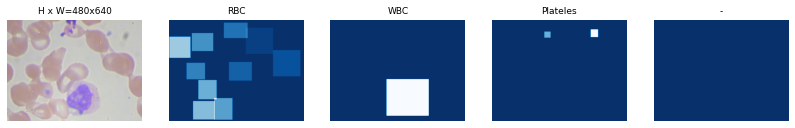

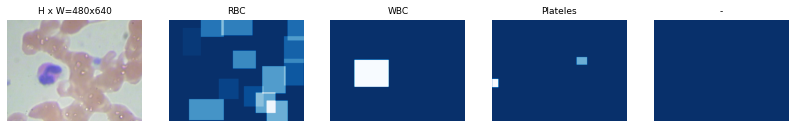

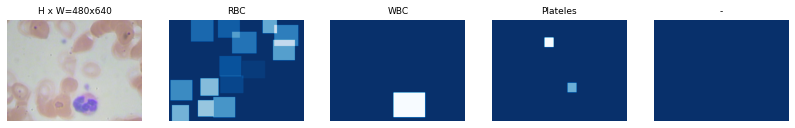

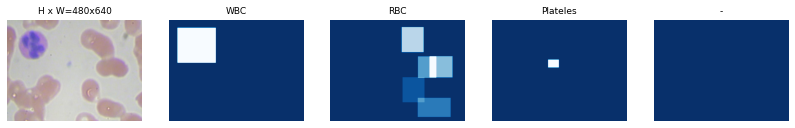

In [ ]:
# Load and display random samples
image_ids = np.random.choice(train_set.image_ids, 4)
for image_id in image_ids:
    image = train_set.load_image(image_id)
    mask, class_ids = train_set.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, train_set.class_names)

#Bounding Box

image_id  39 
image                    shape: (480, 640, 3)         min:   95.00000  max:  255.00000  uint8
mask                     shape: (480, 640, 20)        min:    0.00000  max:    3.00000  uint8
class_ids                shape: (20,)                 min:    1.00000  max:    3.00000  int32
bbox                     shape: (20, 4)               min:    1.00000  max:  630.00000  int32


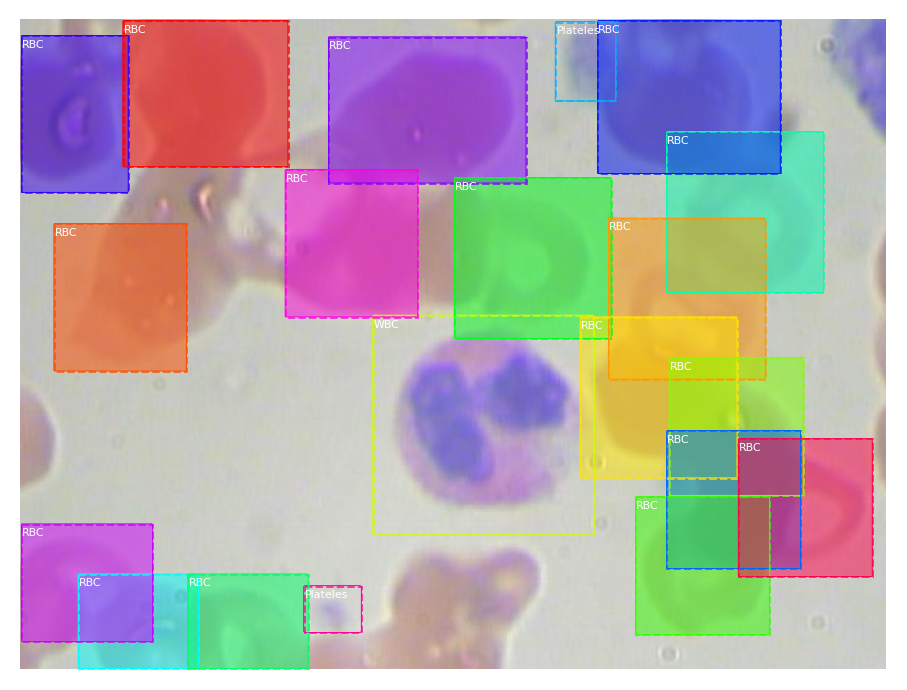

In [ ]:
# Load random image and mask.
image_id = random.choice(train_set.image_ids)
image = train_set.load_image(image_id)
mask, class_ids = train_set.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, train_set.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, train_set.class_names)

#Resize Image

image_id:  353 
Original shape:  (480, 640, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  250.00000  uint8
mask                     shape: (1024, 1024, 18)      min:    0.00000  max:    2.00000  uint8
class_ids                shape: (18,)                 min:    1.00000  max:    2.00000  int32
bbox                     shape: (18, 4)               min:    1.00000  max: 1024.00000  int32


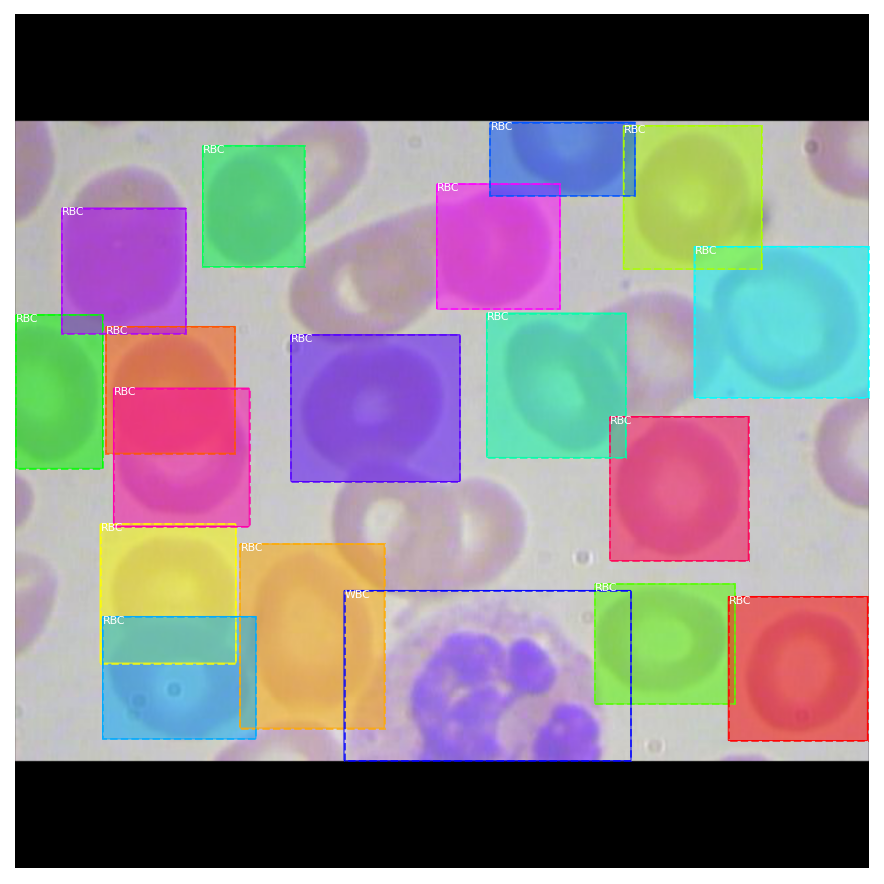

In [ ]:
# Load random image and mask.
image_id = np.random.choice(train_set.image_ids, 1)[0]
image = train_set.load_image(image_id)
mask, class_ids = train_set.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=BloodCellConfig.IMAGE_MIN_DIM, 
    max_dim=BloodCellConfig.IMAGE_MAX_DIM,
    mode=BloodCellConfig.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, train_set.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, train_set.class_names)

#Mini Mask

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  243.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
class_ids                shape: (12,)                 min:    1.00000  max:    3.00000  int32
bbox                     shape: (12, 4)               min:    1.00000  max:  983.00000  int32
mask                     shape: (1024, 1024, 12)      min:    0.00000  max:    3.00000  uint8


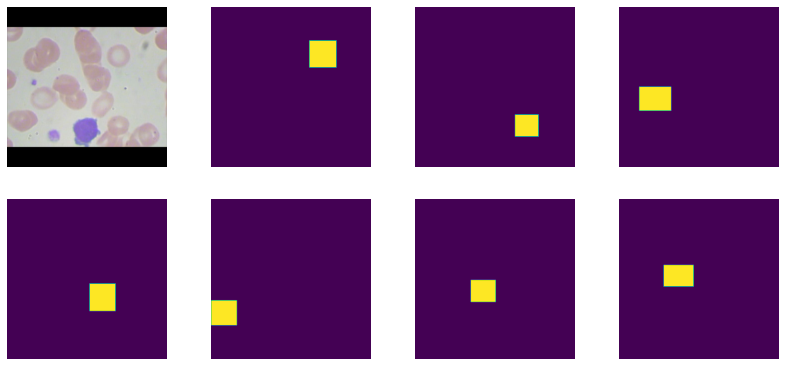

In [ ]:
image_id = np.random.choice(train_set.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    train_set, BloodCellConfig, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

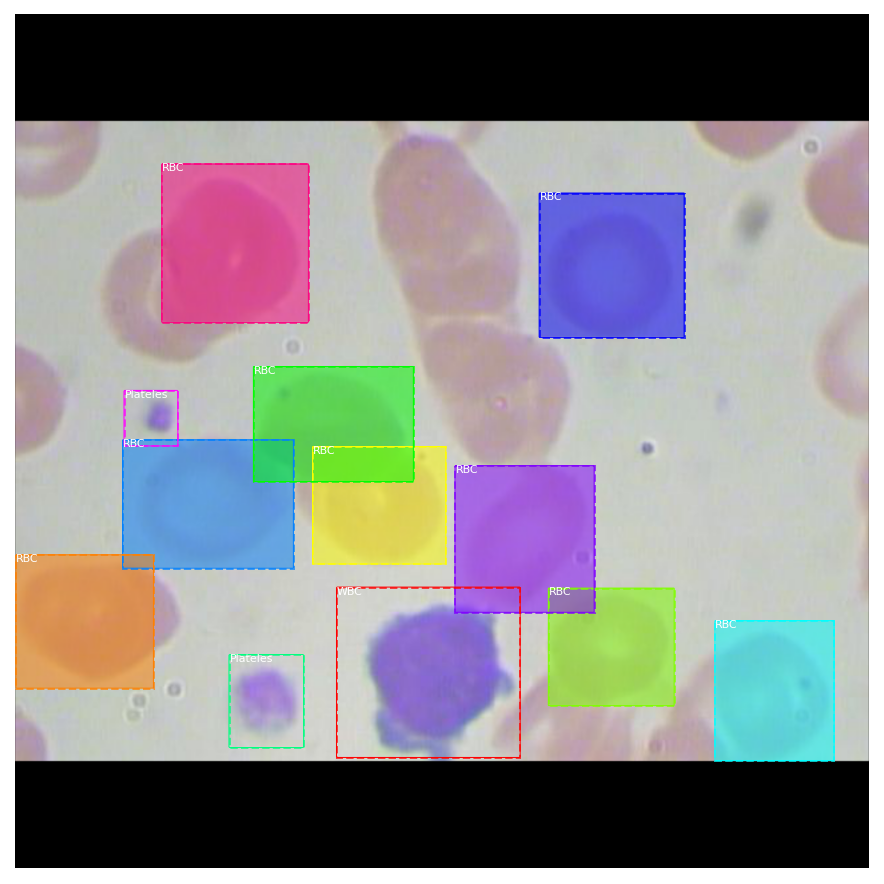

In [ ]:
visualize.display_instances(image, bbox, mask, class_ids, train_set.class_names)

mask                     shape: (56, 56, 12)          min:    1.00000  max:    1.00000  bool


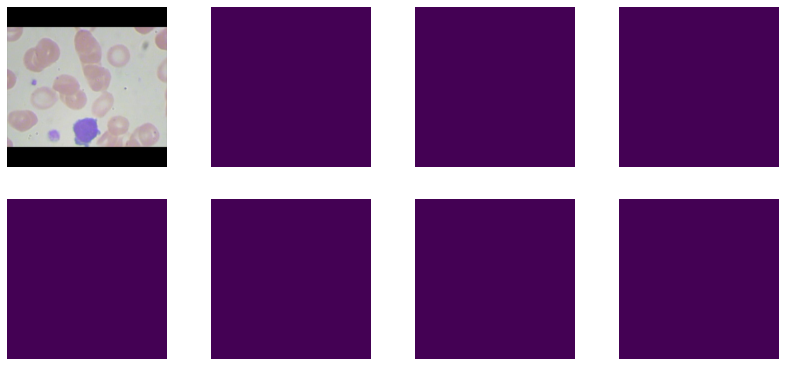

In [ ]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    train_set, BloodCellConfig, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

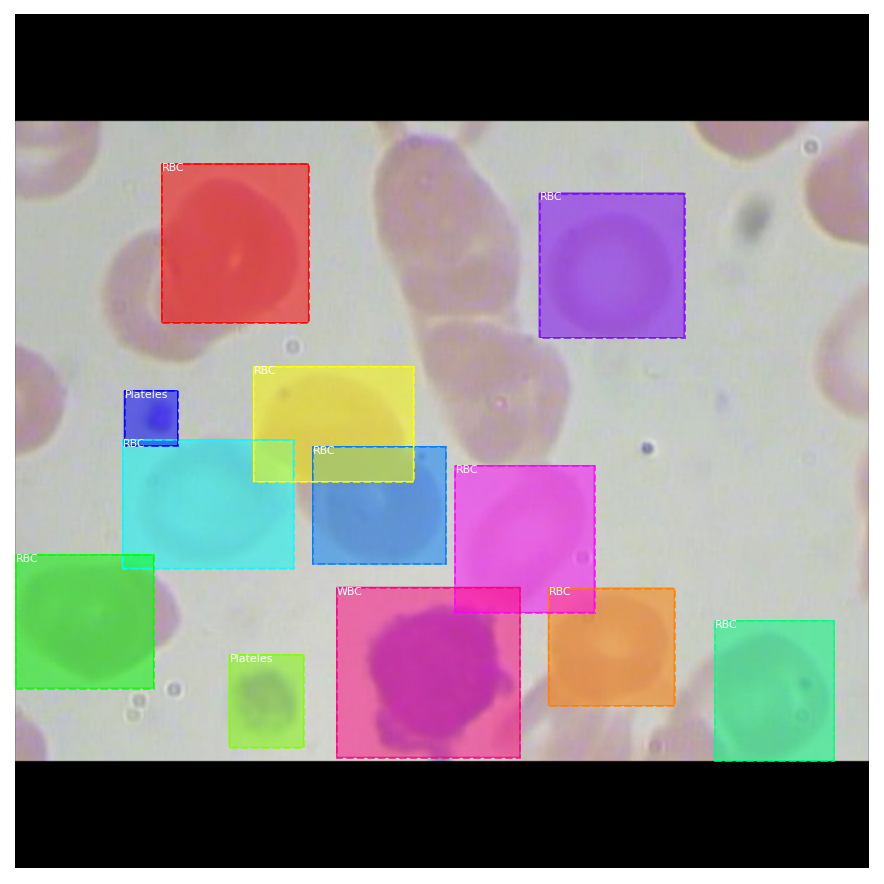

In [ ]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, train_set.class_names)

#Anchors

In [ ]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(bloodcellconfig, bloodcellconfig.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(bloodcellconfig.RPN_ANCHOR_SCALES, 
                                          bloodcellconfig.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          bloodcellconfig.BACKBONE_STRIDES, 
                                          bloodcellconfig.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(bloodcellconfig.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", bloodcellconfig.RPN_ANCHOR_SCALES)
print("ratios: ", bloodcellconfig.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // bloodcellconfig.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


Level 0. Anchors: 196608  Feature map Shape: [256 256]
Level 1. Anchors:  49152  Feature map Shape: [128 128]
Level 2. Anchors:  12288  Feature map Shape: [64 64]
Level 3. Anchors:   3072  Feature map Shape: [32 32]
Level 4. Anchors:    768  Feature map Shape: [16 16]


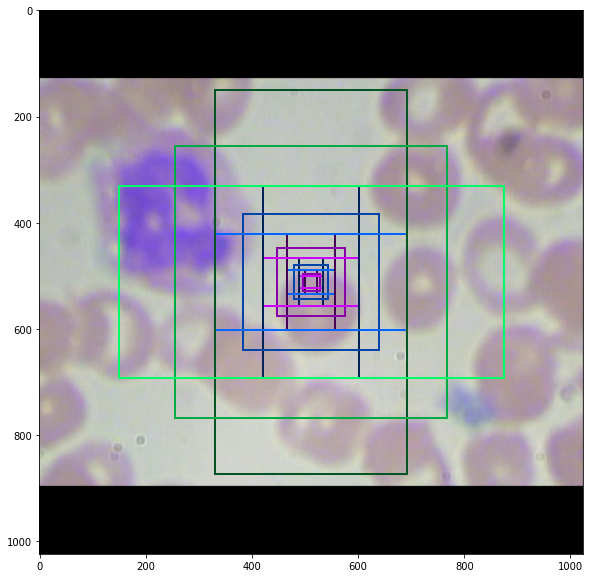

In [ ]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(train_set.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(train_set, bloodcellconfig, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / bloodcellconfig.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / bloodcellconfig.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

#Data Generator

In [ ]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    train_set, bloodcellconfig, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

In [ ]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, train_set.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 200, 4)           min:    0.00000  max: 1021.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    3.00000  int32
mrcnn_bbox               shape: (4, 200, 4, 4)        min:   -3.25926  max:    3.57895  float32
mrcnn_mask               shape: (4, 200, 28, 28, 4)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 10)               min:    0.00000  max:    3.00000  int32
gt_boxes                 shape: (4, 10, 4)            min:    0.00000  max: 1024.00000  int32
gt_masks                 shape: (4, 56, 56, 10)       min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 261888, 1)        min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 256, 4)           min:   -3.92223  max:    3.14883  float64
image_id:  55 


anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (37, 4)               min:    1.00000  max:  999.00000  float32
Positive anchors: 37
Negative anchors: 219
Neutral anchors: 261632
BG                     : 169
RBC                    : 23
WBC                    : 4
Plateles               : 4


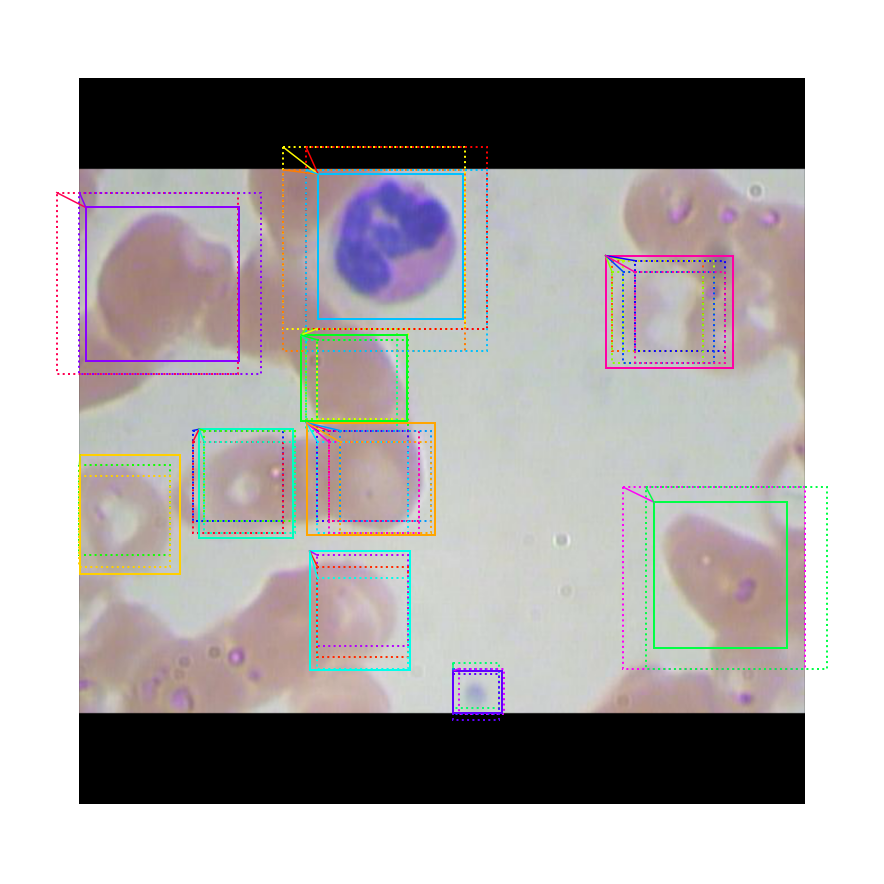

In [ ]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], bloodcellconfig)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * bloodcellconfig.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(train_set.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

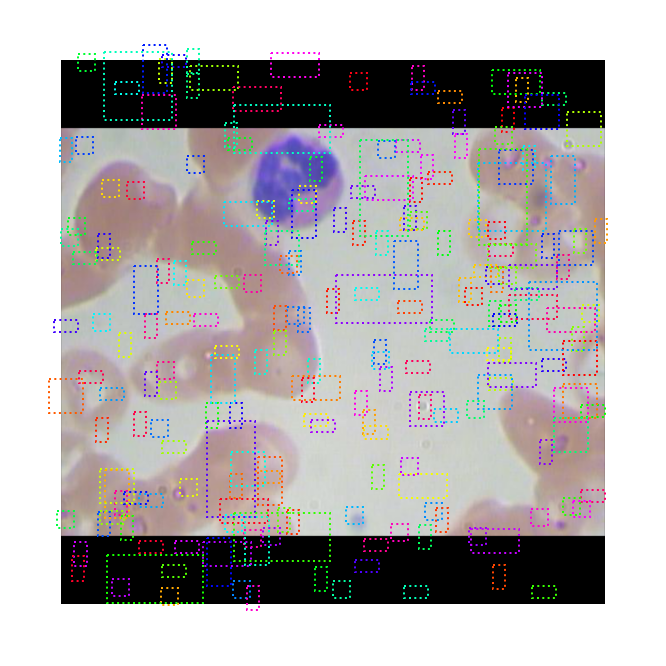

In [ ]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

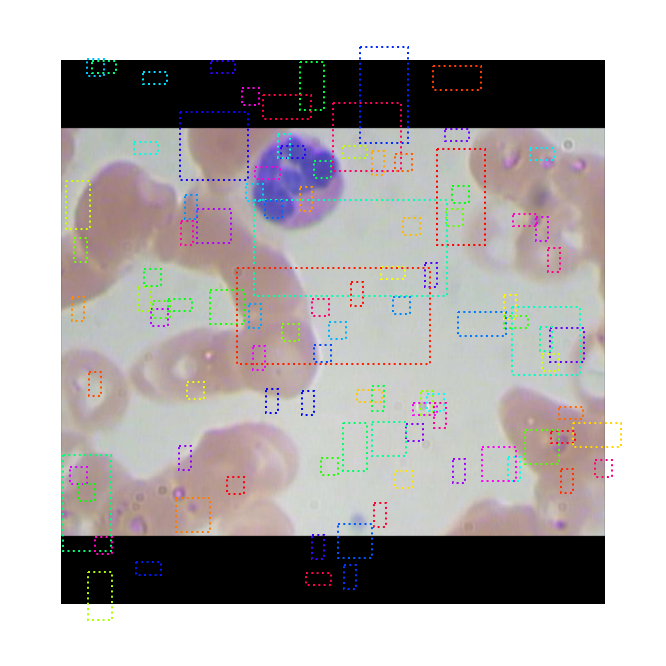

In [ ]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

#ROIs

Positive ROIs:  31
Negative ROIs:  169
Positive Ratio: 0.15
Unique ROIs: 200 out of 200


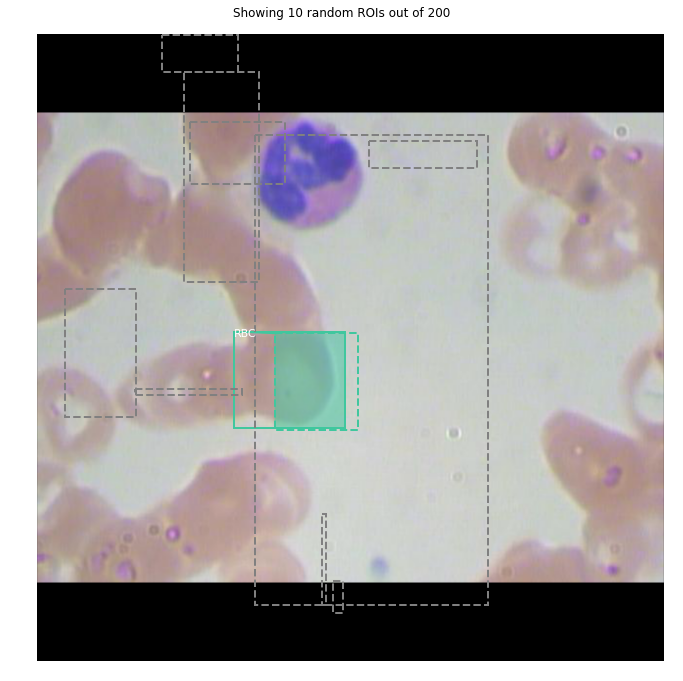

In [ ]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * bloodcellconfig.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], train_set.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

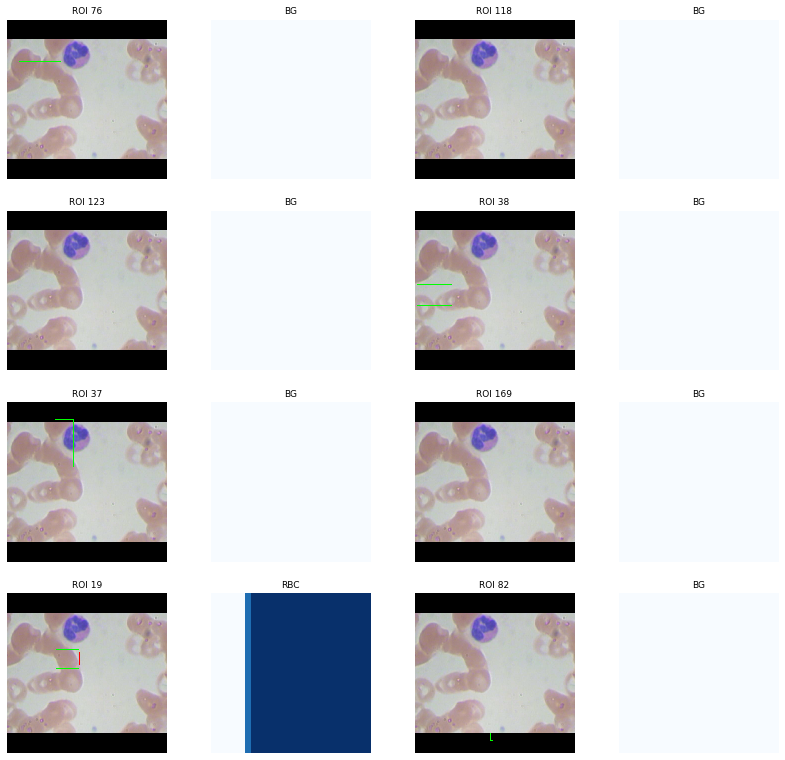

In [ ]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(train_set.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [ ]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        train_set, bloodcellconfig, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
   66  0.33
Average percent: 0.33


#Create Model

In [ ]:
model = modellib.MaskRCNN(mode='training',
                          config=bloodcellconfig,
                          model_dir=MODEL_DIR)

In [ ]:
model.load_weights(COCO_MODEL_PATH,
                   by_name=True,
                   exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])

#Train Model

In [ ]:
model.train(train_dataset=train_set, 
            val_dataset=valid_dataset, 
            learning_rate=bloodcellconfig.LEARNING_RATE, 
            epochs=100, 
            layers='heads')


Starting at epoch 0. LR=0.006

Checkpoint Path: /content/drive/My Drive/DS/Practice/MRCNN/Mask_RCNN/logs/bloodcell_cfg20201004T0910/mask_rcnn_bloodcell_cfg_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_m

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training_generator.py:47: UserWarning: Using a generator with `use_multi

Epoch 1/100
131/131 [==============================] - 146s 1s/step - loss: 1.7272 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.3746 - mrcnn_class_loss: 0.5396 - mrcnn_bbox_loss: 0.4209 - mrcnn_mask_loss: 0.3289 - val_loss: 1.2868 - val_rpn_class_loss: 0.0438 - val_rpn_bbox_loss: 0.2967 - val_mrcnn_class_loss: 0.4412 - val_mrcnn_bbox_loss: 0.2605 - val_mrcnn_mask_loss: 0.2446
Epoch 2/100
131/131 [==============================] - 80s 609ms/step - loss: 1.1638 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.3837 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.2618 - val_loss: 1.1217 - val_rpn_class_loss: 0.0331 - val_rpn_bbox_loss: 0.2737 - val_mrcnn_class_loss: 0.3520 - val_mrcnn_bbox_loss: 0.2270 - val_mrcnn_mask_loss: 0.2360
Epoch 3/100
131/131 [==============================] - 81s 618ms/step - loss: 1.2191 - rpn_class_loss: 0.0452 - rpn_bbox_loss: 0.2971 - mrcnn_class_loss: 0.3811 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.2617 - val_loss: 1.0847 - val_rpn_

#Save weights

In [ ]:
model_path = '/content/drive/My Drive/DS/Practice/MRCNN/BloodCell_Detection/custom100_bloodcell_model.h5'
model.keras_model.save_weights(model_path)

#Visualize loss

10 epochs

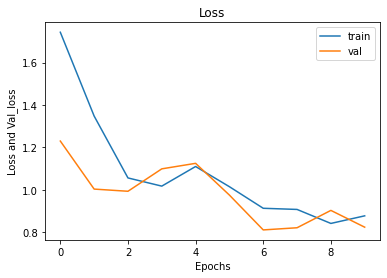

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['loss'])
plt.plot(model.keras_model.history.history['val_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

5 epochs

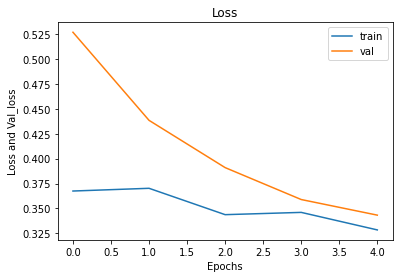

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['val_mrcnn_class_loss'])
plt.plot(model.keras_model.history.history['mrcnn_class_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

15 epochs

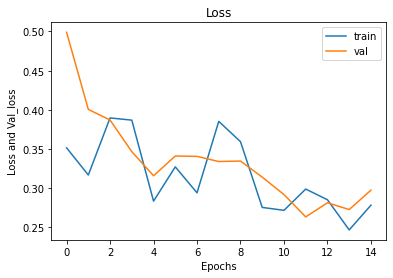

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['val_mrcnn_class_loss'])
plt.plot(model.keras_model.history.history['mrcnn_class_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

20 epochs

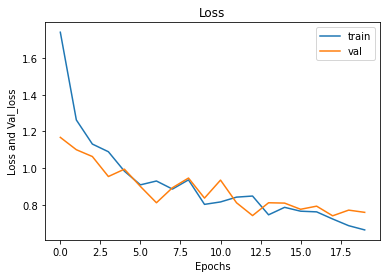

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['loss'])
plt.plot(model.keras_model.history.history['val_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

30 epochs

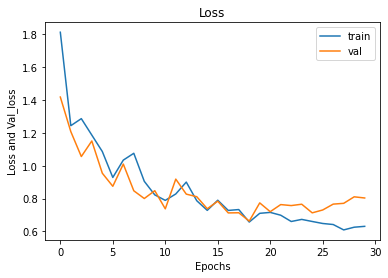

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['loss'])
plt.plot(model.keras_model.history.history['val_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

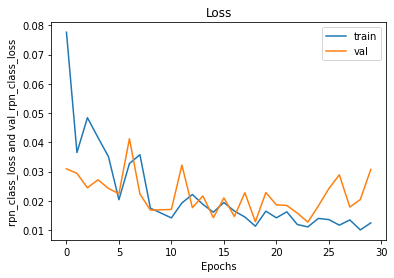

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['rpn_class_loss'])
plt.plot(model.keras_model.history.history['val_rpn_class_loss'])
plt.xlabel('Epochs')
plt.ylabel('rpn_class_loss and val_rpn_class_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

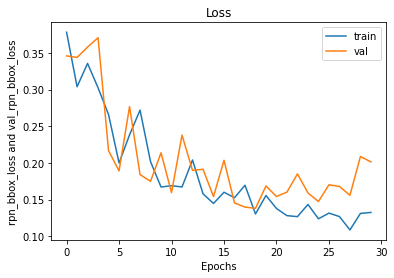

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['rpn_bbox_loss'])
plt.plot(model.keras_model.history.history['val_rpn_bbox_loss'])
plt.xlabel('Epochs')
plt.ylabel('rpn_bbox_loss and val_rpn_bbox_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

100 epochs

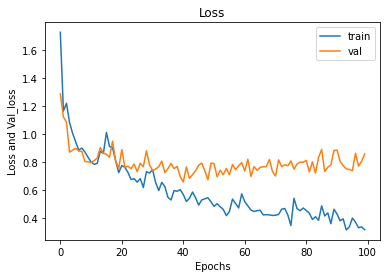

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['loss'])
plt.plot(model.keras_model.history.history['val_loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss and Val_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

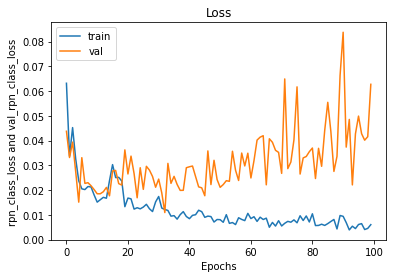

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['rpn_class_loss'])
plt.plot(model.keras_model.history.history['val_rpn_class_loss'])
plt.xlabel('Epochs')
plt.ylabel('rpn_class_loss and val_rpn_class_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

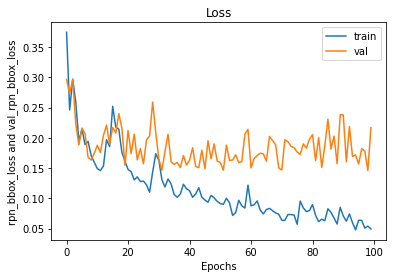

In [ ]:
fig = plt.figure()
#plot loss and val_loss
plt.plot(model.keras_model.history.history['rpn_bbox_loss'])
plt.plot(model.keras_model.history.history['val_rpn_bbox_loss'])
plt.xlabel('Epochs')
plt.ylabel('rpn_bbox_loss and val_rpn_bbox_loss')
plt.title('Loss')
plt.legend(['train', 'val'])
plt.show()

#Load weights

In [ ]:
# Initialize the Mask R-CNN model for inference and then load the weights.
# This step builds the Keras model architecture.
model = modellib.MaskRCNN(mode="inference", 
                             config=bloodcellconfig,
                             model_dir=MODEL_DIR)

# loading the trained weights on the blood cell dataset
model.load_weights(model_path, by_name=True)

#Predict

#1

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  241.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (13, 4)               min:  105.00000  max:  981.00000  int32
gt_mask                  shape: (1024, 1024, 13)      min:    0.00000  max:    2.00000  uint8


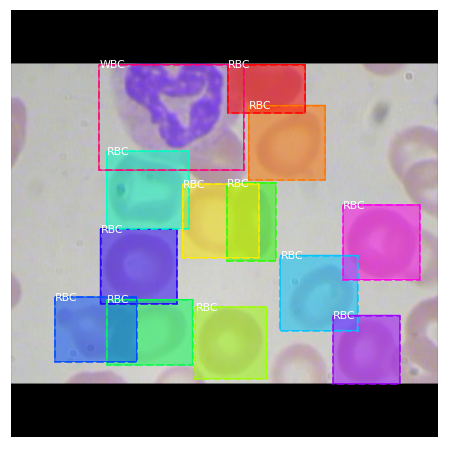

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

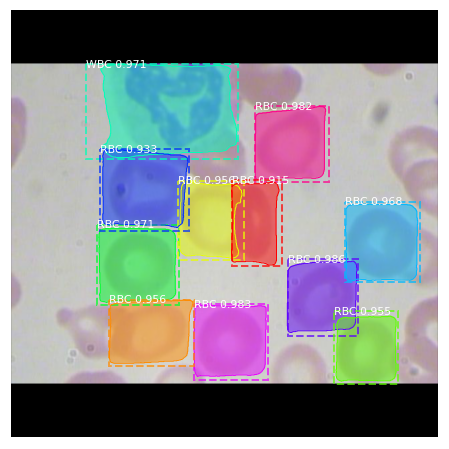

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#2

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  245.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (15,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (15, 4)               min:    1.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 15)      min:    0.00000  max:    2.00000  uint8


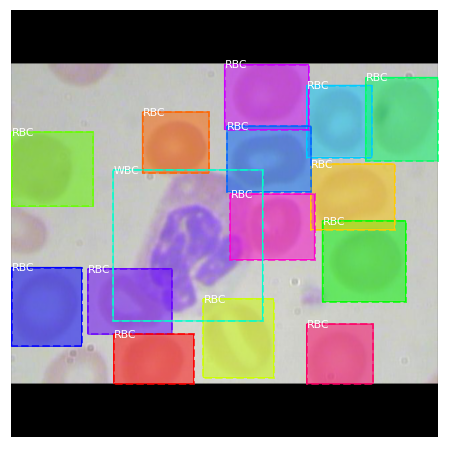

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

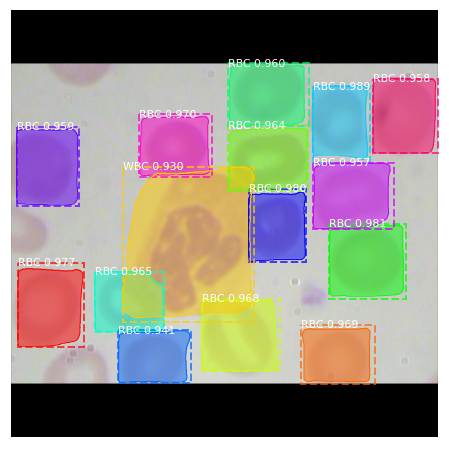

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#3

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  243.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (15,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (15, 4)               min:    3.00000  max: 1018.00000  int32
gt_mask                  shape: (1024, 1024, 15)      min:    0.00000  max:    3.00000  uint8


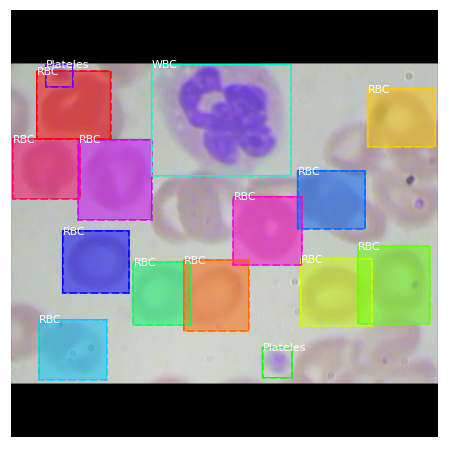

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

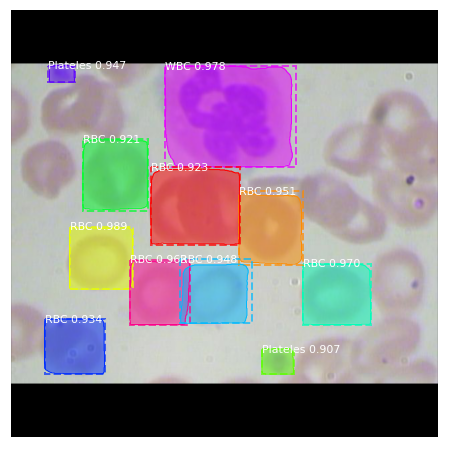

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#4

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  241.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (13, 4)               min:    1.00000  max:  955.00000  int32
gt_mask                  shape: (1024, 1024, 13)      min:    0.00000  max:    2.00000  uint8


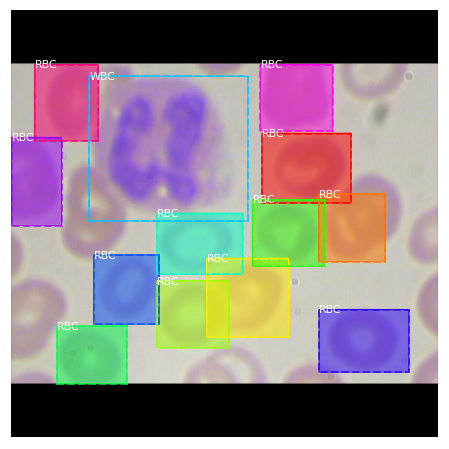

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

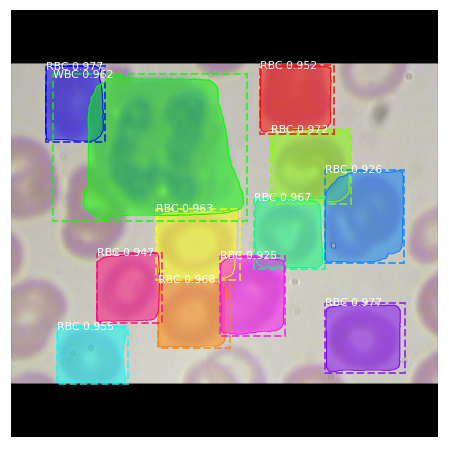

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#5

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  243.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (17,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (17, 4)               min:   37.00000  max: 1013.00000  int32
gt_mask                  shape: (1024, 1024, 17)      min:    0.00000  max:    3.00000  uint8


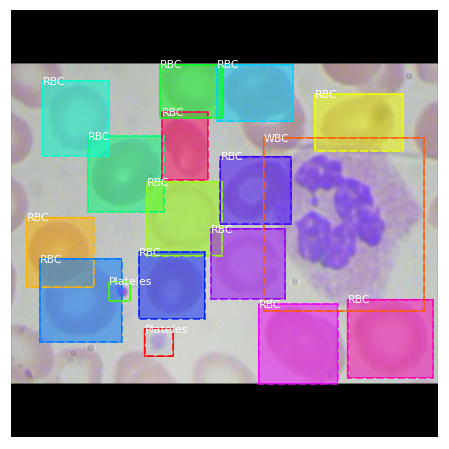

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

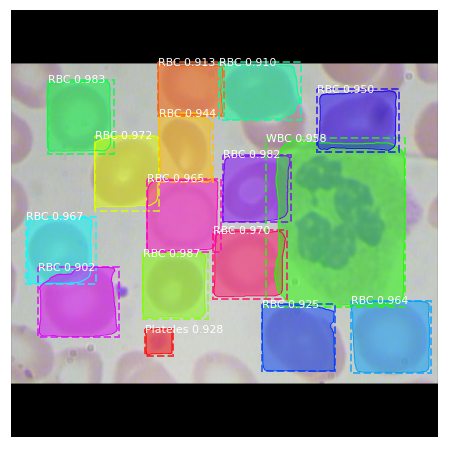

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#6

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (11,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (11, 4)               min:    1.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 11)      min:    0.00000  max:    2.00000  uint8


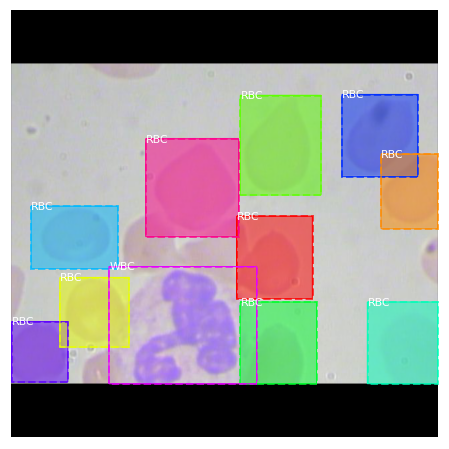

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

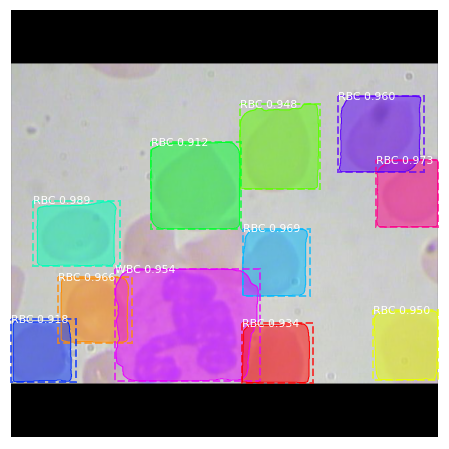

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#7

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  244.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (12,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (12, 4)               min:    1.00000  max: 1010.00000  int32
gt_mask                  shape: (1024, 1024, 12)      min:    0.00000  max:    3.00000  uint8


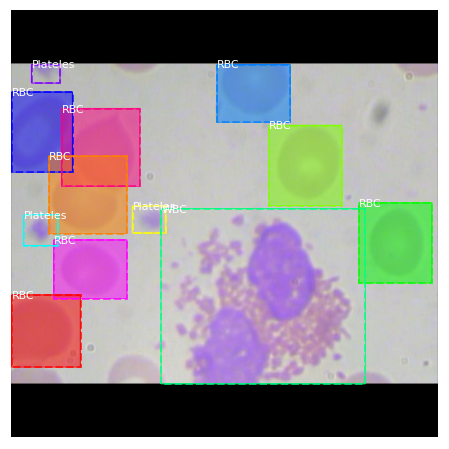

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

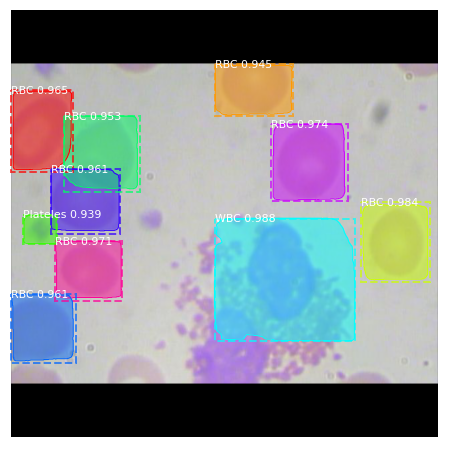

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#8

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  241.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (13, 4)               min:  105.00000  max:  981.00000  int32
gt_mask                  shape: (1024, 1024, 13)      min:    0.00000  max:    2.00000  uint8


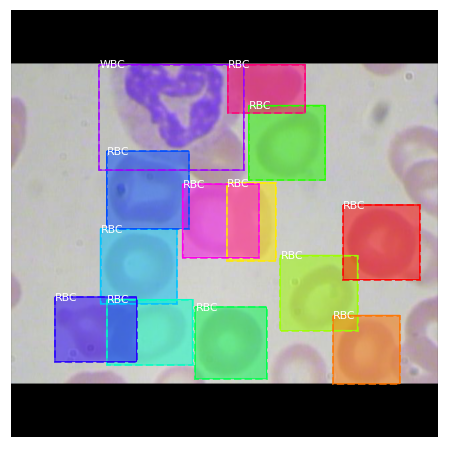

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

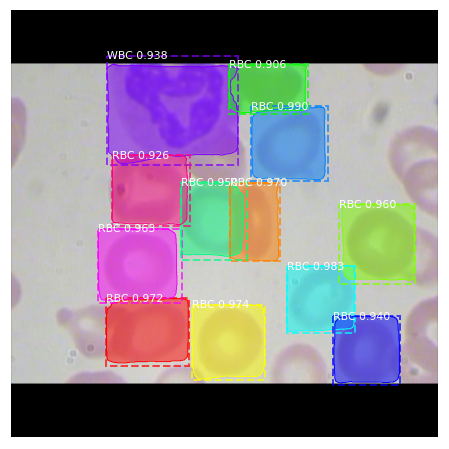

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#9

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  237.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (13, 4)               min:   16.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 13)      min:    0.00000  max:    2.00000  uint8


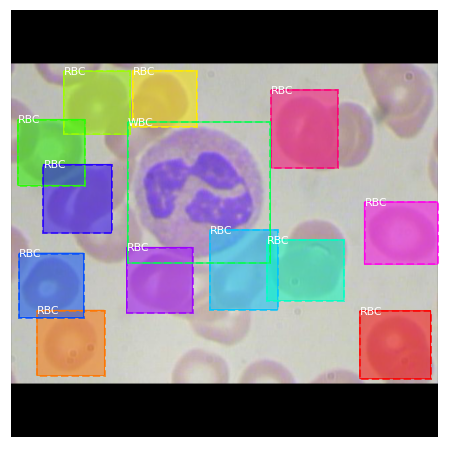

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

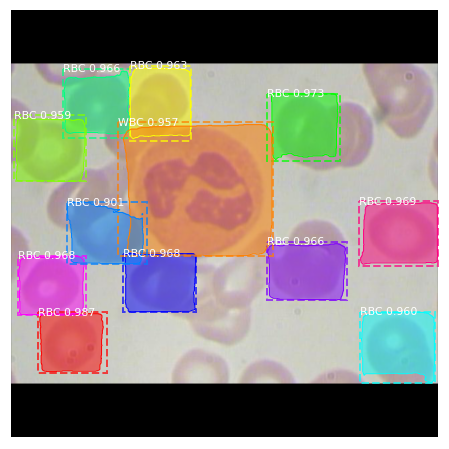

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#10

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  253.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (13,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (13, 4)               min:    1.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 13)      min:    0.00000  max:    3.00000  uint8


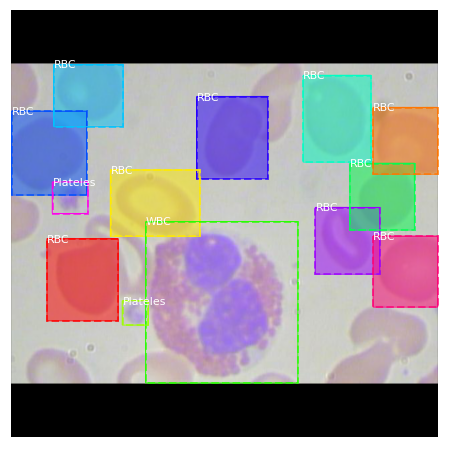

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

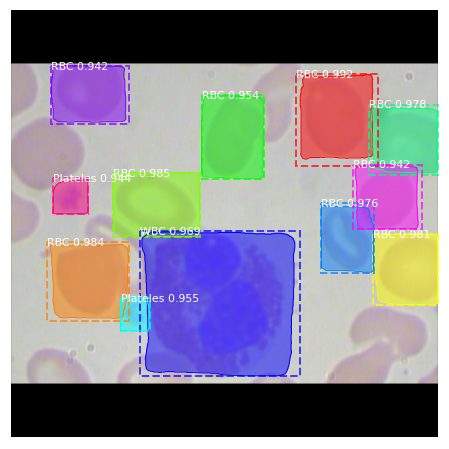

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#11

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  237.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (16,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (16, 4)               min:    1.00000  max: 1021.00000  int32
gt_mask                  shape: (1024, 1024, 16)      min:    0.00000  max:    3.00000  uint8


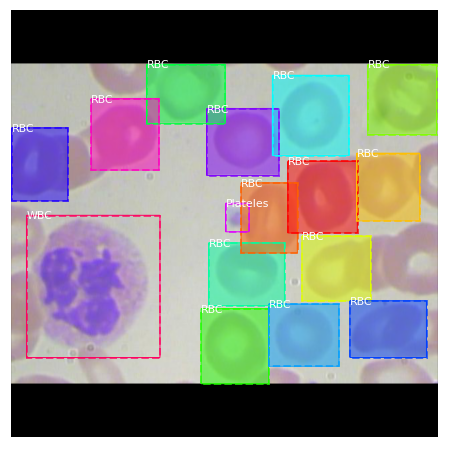

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

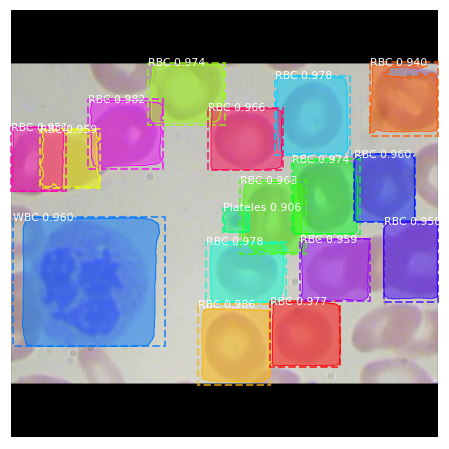

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#12

original_image           shape: (1024, 1024, 3)       min:    0.00000  max:  237.00000  uint8
image_meta               shape: (16,)                 min:    0.00000  max: 1024.00000  float64
gt_class_id              shape: (20,)                 min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (20, 4)               min:    1.00000  max: 1024.00000  int32
gt_mask                  shape: (1024, 1024, 20)      min:    0.00000  max:    3.00000  uint8


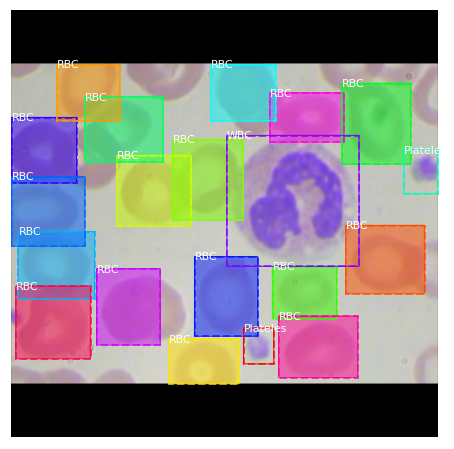

In [ ]:
# Test on a random image
image_id = random.choice(valid_dataset.image_ids)
original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(valid_dataset, bloodcellconfig, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            valid_dataset.class_names, figsize=(8, 8))

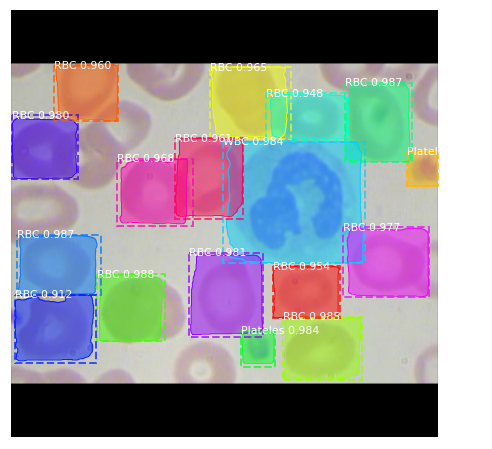

In [ ]:
# Perform a forward pass of the network to obtain the results
r = model.detect([original_image], verbose=0)

# Get the results for the first image.
r = r[0]

# Visualize the detected objects.
visualize.display_instances(image=original_image, 
                                  boxes=r['rois'], 
                                  masks=r['masks'], 
                                  class_ids=r['class_ids'],
                                  class_names=valid_dataset.class_names,
                                  scores=r['scores'],
                                  figsize=(8, 8))

#Evaluate

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 30 images. Increase for better accuracy.
image_ids = np.random.choice(valid_dataset.image_ids, valid_dataset.num_images)
APs = []
pre = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(valid_dataset, bloodcellconfig,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, bloodcellconfig), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    pre.append(np.mean(precisions))
    
print("mAP: ", np.mean(APs))
print("Precision: ", np.mean(pre))

mAP:  0.8452580719876042
Precision:  0.9004242629405077
